### 데이터 전처리

In [1]:
# !pip install plotly

In [ ]:
# !pip install chart_studio

In [2]:
# 필요한 라이브러리 import
import pandas as pd 
import folium
import json
import numpy as np 
from folium.plugins import MarkerCluster
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams, style, font_manager, rc
import matplotlib as mpl

import folium
import plotly.express as px

In [3]:
import chart_studio
chart_studio.tools.set_credentials_file(username='username', api_key='api_key')
import chart_studio.plotly as py
import plotly.express as px

In [4]:
# 한글폰트 설정
font_path = 'C:/Windows/Fonts/malgun.ttf'
font_name = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font_name)

In [5]:
# 마이너스 깨질 때
mpl.rcParams['axes.unicode_minus']=False

In [6]:
df = pd.read_excel('./data/부산시_주요상권현황.xlsx')
df

,상권번호,상권명,시도코드,시도명,시군구코드,시군구명,상권좌표수,상권좌표,데이터기준일자
0,9166,경복궁역_1,11,서울특별시,11110,종로구,27,"126.969907613023,37.5767094984708|126.96929616...",2020-12-31
1,9167,경복궁역_2,11,서울특별시,11110,종로구,22,"126.973755749544,37.578949417888|126.973715995...",2020-12-31
2,9168,광화문역_1,11,서울특별시,11110,종로구,23,"126.971466989248,37.5696821877347|126.97091248...",2020-12-31
3,9169,광화문역_2,11,서울특별시,11110,종로구,47,"126.971923689207,37.5740926458369|126.97078021...",2020-12-31
4,9148,서대문역_1,11,서울특별시,11110,종로구,23,"126.964186310044,37.5686034361487|126.96418914...",2020-12-31
...,...,...,...,...,...,...,...,...,...
1161,9803,대학로,50,제주특별자치도,50110,제주시,18,"126.526856613594,33.5001078818046|126.52692324...",2020-12-31
1162,9804,연동,50,제주특별자치도,50110,제주시,65,"126.489587309299,33.4909233633169|126.48957654...",2020-12-31
1163,9806,노형동,50,제주특별자치도,50110,제주시,44,"126.477411092495,33.4884021192214|126.47741375...",2020-12-31
1164,9801,중앙동,50,제주특별자치도,50130,서귀포시,78,"126.559286584631,33.2526874364759|126.55927846...",2020-12-31


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1166 entries, 0 to 1165
Data columns (total 9 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   상권번호     1166 non-null   int64 
 1   상권명      1166 non-null   object
 2   시도코드     1166 non-null   int64 
 3   시도명      1166 non-null   object
 4   시군구코드    1166 non-null   int64 
 5   시군구명     1166 non-null   object
 6   상권좌표수    1166 non-null   int64 
 7   상권좌표     1166 non-null   object
 8   데이터기준일자  1166 non-null   object
dtypes: int64(4), object(5)
memory usage: 82.1+ KB


In [8]:
busan = df[df['시도명'] == '부산광역시']
busan

,상권번호,상권명,시도코드,시도명,시군구코드,시군구명,상권좌표수,상권좌표,데이터기준일자
254,9521,남포역_1,26,부산광역시,26110,중구,22,"129.03579326842,35.0977859285196|129.036273648...",2020-12-31
255,9525,중앙역_1,26,부산광역시,26110,중구,28,"129.036609661589,35.1053735731166|129.03706785...",2020-12-31
256,9526,중앙역_2,26,부산광역시,26110,중구,77,"129.036239145334,35.1030412650373|129.03620690...",2020-12-31
257,9523,자갈치역_1,26,부산광역시,26110,중구,16,"129.028092688429,35.0978788947122|129.02774852...",2020-12-31
258,9522,남포역_2,26,부산광역시,26110,중구,81,"129.036250380241,35.1028315548985|129.03557006...",2020-12-31
...,...,...,...,...,...,...,...,...,...
351,9442,감전동_1,26,부산광역시,26530,사상구,10,"128.979903370707,35.1513510851083|128.98191684...",2020-12-31
352,9443,감전동_2,26,부산광역시,26530,사상구,5,"128.983380093426,35.1560389092037|128.98240606...",2020-12-31
353,9448,엄궁동,26,부산광역시,26530,사상구,30,"128.96506558359,35.1322645766014|128.966759093...",2020-12-31
354,9478,기장역,26,부산광역시,26710,기장군,17,"129.213789605767,35.2450965290783|129.21362974...",2020-12-31


In [9]:
busan.shape

(102, 9)

In [10]:
# 사용할 column만 추출
columns = ['상권명', '시도명', '시군구명', '상권좌표수', '상권좌표']

busan = busan[columns].copy()
busan.head()

,상권명,시도명,시군구명,상권좌표수,상권좌표
254,남포역_1,부산광역시,중구,22,"129.03579326842,35.0977859285196|129.036273648..."
255,중앙역_1,부산광역시,중구,28,"129.036609661589,35.1053735731166|129.03706785..."
256,중앙역_2,부산광역시,중구,77,"129.036239145334,35.1030412650373|129.03620690..."
257,자갈치역_1,부산광역시,중구,16,"129.028092688429,35.0978788947122|129.02774852..."
258,남포역_2,부산광역시,중구,81,"129.036250380241,35.1028315548985|129.03557006..."


In [11]:
busan.shape

(102, 5)

In [12]:
busan_gu = busan.groupby('시군구명')
busan_gu.mean().mean()

상권좌표수    22.755926
dtype: float64

In [13]:
busan_mean = busan[busan['상권좌표수'] > 22.75]
busan_mean.shape

(49, 5)

In [14]:
busan_loc = busan['상권좌표'].str.split('|')
busan_loc

254    [129.03579326842,35.0977859285196, 129.0362736...
255    [129.036609661589,35.1053735731166, 129.037067...
256    [129.036239145334,35.1030412650373, 129.036206...
257    [129.028092688429,35.0978788947122, 129.027748...
258    [129.036250380241,35.1028315548985, 129.035570...
                             ...                        
351    [128.979903370707,35.1513510851083, 128.981916...
352    [128.983380093426,35.1560389092037, 128.982406...
353    [128.96506558359,35.1322645766014, 128.9667590...
354    [129.213789605767,35.2450965290783, 129.213629...
355    [129.216712673187,35.2460500287917, 129.215840...
Name: 상권좌표, Length: 102, dtype: object

In [15]:
# busan_loc = busan_loc.reset_index(drop=True)
# busan_loc

In [16]:
busan_loc.info()

<class 'pandas.core.series.Series'>
Int64Index: 102 entries, 254 to 355
Series name: 상권좌표
Non-Null Count  Dtype 
--------------  ----- 
102 non-null    object
dtypes: object(1)
memory usage: 1.6+ KB


In [17]:
busan_loc[254]

['129.03579326842,35.0977859285196',
 '129.036273648114,35.0964891932217',
 '129.036734371522,35.0966076207797',
 '129.037261309525,35.0968533508376',
 '129.037692072784,35.097199822912',
 '129.037768743462,35.0973066749265',
 '129.037783732214,35.0973582402602',
 '129.037732772673,35.0982850467161',
 '129.037724015871,35.0988146300662',
 '129.037700209221,35.0991800030877',
 '129.037681770703,35.0995407800571',
 '129.03720151642,35.0995195600976',
 '129.037191792023,35.0996796807628',
 '129.037155966331,35.1002232362344',
 '129.036730679506,35.1002078499233',
 '129.03676690351,35.0997904513678',
 '129.036775281373,35.099465890162',
 '129.03677662169,35.0994095446463',
 '129.0366469323,35.0991548896472',
 '129.036310222557,35.0988428816677',
 '129.035820288292,35.0983216702132',
 '129.03579326842,35.0977859285196']

In [18]:
# df = pd.DataFrame(df['clusters'].values.tolist(), index=df.index)
busan_loc = pd.DataFrame(busan_loc.values.tolist(), index=busan.index)
busan_loc

,0,1,2,3,4,5,6,7,8,9,...,75,76,77,78,79,80,81,82,83,84
254,"129.03579326842,35.0977859285196","129.036273648114,35.0964891932217","129.036734371522,35.0966076207797","129.037261309525,35.0968533508376","129.037692072784,35.097199822912","129.037768743462,35.0973066749265","129.037783732214,35.0973582402602","129.037732772673,35.0982850467161","129.037724015871,35.0988146300662","129.037700209221,35.0991800030877",...,None,None,None,None,None,None,None,None,None,None
255,"129.036609661589,35.1053735731166","129.037067859468,35.105388406555","129.037709940731,35.1054114132147","129.038077803435,35.1062027643217","129.038124631368,35.1065421678397","129.038207451068,35.1074464485799","129.038251359786,35.1075583564265","129.038764614396,35.1086829456501","129.038845720506,35.1088573095109","129.039098271835,35.1094207979373",...,None,None,None,None,None,None,None,None,None,None
256,"129.036239145334,35.1030412650373","129.036206902182,35.1039497328451","129.036168164265,35.1045969710008","129.036132723166,35.1051562899124","129.036089340636,35.1057270067029","129.036057137142,35.1060857614223","129.035988816387,35.1068664182129","129.036001068673,35.1070284226183","129.036110190309,35.1073374932065","129.036241908154,35.1076732192663",...,"129.035335917711,35.1029888394826","129.036239145334,35.1030412650373",None,None,None,None,None,None,None,None
257,"129.028092688429,35.0978788947122","129.027748526548,35.0989255005598","129.027736853577,35.0994506271653","129.027836910887,35.102938733431","129.024660520275,35.1030864265027","129.024632983208,35.1023051212531","129.023874486298,35.1023403106577","129.023761898728,35.1006682656099","129.023887461431,35.100535500609","129.024216869322,35.1003317456178",...,None,None,None,None,None,None,None,None,None,None
258,"129.036250380241,35.1028315548985","129.035570067546,35.1028136876764","129.03497956817,35.1027695274901","129.034018798392,35.1027180575687","129.033848790307,35.1027164029553","129.033827596148,35.1023044739068","129.033840682537,35.1021690792002","129.033891461212,35.102006017323","129.033543396346,35.1017888149118","129.033682143238,35.1014147563942",...,"129.036207558514,35.0991239675119","129.036420511535,35.0993096373454","129.036461896703,35.0994306001451","129.036428927612,35.1003097926459","129.036359498902,35.1012661965074","129.036250380241,35.1028315548985",None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
351,"128.979903370707,35.1513510851083","128.9819168405,35.1510140332855","128.982848359962,35.1547003590388","128.980892607096,35.1550454960607","128.980840070568,35.1550283312653","128.980727972754,35.1545908422044","128.979771622299,35.1547461489709","128.979501354728,35.1540070966932","128.980544788622,35.1538233340704","128.979903370707,35.1513510851083",...,None,None,None,None,None,None,None,None,None,None
352,"128.983380093426,35.1560389092037","128.982406060173,35.1520716682","128.985990433397,35.1514722879414","128.986985253954,35.1553850866298","128.983380093426,35.1560389092037",None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
353,"128.96506558359,35.1322645766014","128.966759093394,35.1318676331825","128.967779050412,35.1316302945455","128.967725265251,35.1314464262472","128.967061073468,35.1293709793353","128.966369181148,35.127282459176","128.967993727205,35.1268731007933","128.968793437284,35.1270583766834","128.969277322525,35.1277939894488","128.970225310457,35.129125847589",...,None,None,None,None,None,None,None,None,None,None
354,"129.213789605767,35.2450965290783","129.213629742854,35.2429525473163","129.214062913934,35.2416132282126","129.21427067475,35.2418820152148","129.215173285049,35.2418519844903","129.216575535482,35.2418173046476","129.216592590763,35.2421413934497","129.217608099099,35.2421227938344","129.217372718523,35.2429583833423","129.216582811998,35.2429931253447",...,None,None,None,None,None,None,None,None,None,None


In [19]:
busan_df = pd.DataFrame(busan_loc.stack()).reset_index()
df_1 = busan_df.rename(columns={0:'좌표'})
df_1.pivot_table(index=['level_0','level_1','좌표'])

Empty DataFrame
Columns: []
Index: [(254, 0, 129.03579326842,35.0977859285196), (254, 1, 129.036273648114,35.0964891932217), (254, 2, 129.036734371522,35.0966076207797), (254, 3, 129.037261309525,35.0968533508376), (254, 4, 129.037692072784,35.097199822912), (254, 5, 129.037768743462,35.0973066749265), (254, 6, 129.037783732214,35.0973582402602), (254, 7, 129.037732772673,35.0982850467161), (254, 8, 129.037724015871,35.0988146300662), (254, 9, 129.037700209221,35.0991800030877), (254, 10, 129.037681770703,35.0995407800571), (254, 11, 129.03720151642,35.0995195600976), (254, 12, 129.037191792023,35.0996796807628), (254, 13, 129.037155966331,35.1002232362344), (254, 14, 129.036730679506,35.1002078499233), (254, 15, 129.03676690351,35.0997904513678), (254, 16, 129.036775281373,35.099465890162), (254, 17, 129.03677662169,35.0994095446463), (254, 18, 129.0366469323,35.0991548896472), (254, 19, 129.036310222557,35.0988428816677), (254, 20, 129.035820288292,35.0983216702132), (254, 21, 129.03579326842,35.0977859285196), (255, 0, 129.036609661589,35.1053735731166), (255, 1, 129.037067859468,35.105388406555), (255, 2, 129.037709940731,35.1054114132147), (255, 3, 129.038077803435,35.1062027643217), (255, 4, 129.038124631368,35.1065421678397), (255, 5, 129.038207451068,35.1074464485799), (255, 6, 129.038251359786,35.1075583564265), (255, 7, 129.038764614396,35.1086829456501), (255, 8, 129.038845720506,35.1088573095109), (255, 9, 129.039098271835,35.1094207979373), (255, 10, 129.039365651021,35.1100290946754), (255, 11, 129.039621062608,35.1105970395183), (255, 12, 129.039934598774,35.1112969279097), (255, 13, 129.039330573869,35.1114828149868), (255, 14, 129.038443266499,35.1117433018515), (255, 15, 129.038216186405,35.1116524964603), (255, 16, 129.038047923388,35.1111709476827), (255, 17, 129.037804485776,35.1105329577888), (255, 18, 129.037601828753,35.1099911574616), (255, 19, 129.037365952622,35.1094363973208), (255, 20, 129.037253914547,35.1091206183345), (255, 21, 129.036996287985,35.1085729814711), (255, 22, 129.03668709686,35.1079360932921), (255, 23, 129.036457386312,35.1074082624694), (255, 24, 129.036301281025,35.1069738177529), (255, 25, 129.03632687951,35.1064597225833), (255, 26, 129.0364175608,35.105475927477), (255, 27, 129.036609661589,35.1053735731166), (256, 0, 129.036239145334,35.1030412650373), (256, 1, 129.036206902182,35.1039497328451), (256, 2, 129.036168164265,35.1045969710008), (256, 3, 129.036132723166,35.1051562899124), (256, 4, 129.036089340636,35.1057270067029), (256, 5, 129.036057137142,35.1060857614223), (256, 6, 129.035988816387,35.1068664182129), (256, 7, 129.036001068673,35.1070284226183), (256, 8, 129.036110190309,35.1073374932065), (256, 9, 129.036241908154,35.1076732192663), (256, 10, 129.03642497102,35.1080891879658), (256, 11, 129.036592317336,35.108424315254), (256, 12, 129.03687494101,35.1089850506796), (256, 13, 129.037085979971,35.1095334703753), (256, 14, 129.037247071692,35.1099475537408), (256, 15, 129.037489998716,35.1105652772476), (256, 16, 129.037710220704,35.1111518408638), (256, 17, 129.037916126706,35.1117138624961), (256, 18, 129.037724747403,35.1119558877189), (256, 19, 129.037301024434,35.1120058127793), (256, 20, 129.037138247012,35.1115241705183), (256, 21, 129.037067599502,35.1113293536251), (256, 22, 129.036960536471,35.1109932146562), (256, 23, 129.03692188439,35.110872206434), (256, 24, 129.036931894149,35.1108337387145), (256, 25, 129.037266849958,35.1107425009804), (256, 26, 129.037243468992,35.1106843179607), (256, 27, 129.037115327236,35.1104927198749), (256, 28, 129.036891479078,35.1099805621788), (256, 29, 129.036577025957,35.1093527739799), (256, 30, 129.036389724957,35.109428012784), (256, 31, 129.036187538416,35.1092354040901), (256, 32, 129.035873898279,35.1094118917772), (256, 33, 129.035799065438,35.1093793543269), (256, 34, 129.03584894811,35.10918026015), (256, 35, 129.035801850432,35.1089399886483), (256, 36, 129.035664989695,35.1087282589853), (256, 37, 129.03

In [20]:
df_1.index

RangeIndex(start=0, stop=2392, step=1)

In [21]:
df_1.set_index('level_0', inplace=True)

In [22]:
df_1

,level_1,좌표
level_0,,
254,0,"129.03579326842,35.0977859285196"
254,1,"129.036273648114,35.0964891932217"
254,2,"129.036734371522,35.0966076207797"
254,3,"129.037261309525,35.0968533508376"
254,4,"129.037692072784,35.097199822912"
...,...,...
355,9,"129.214646547986,35.2461126292295"
355,10,"129.214603950951,35.245252844601"
355,11,"129.216634005443,35.2451773891274"


In [23]:
busan_df = busan.join(df_1, how='inner')
busan_df

,상권명,시도명,시군구명,상권좌표수,상권좌표,level_1,좌표
254,남포역_1,부산광역시,중구,22,"129.03579326842,35.0977859285196|129.036273648...",0,"129.03579326842,35.0977859285196"
254,남포역_1,부산광역시,중구,22,"129.03579326842,35.0977859285196|129.036273648...",1,"129.036273648114,35.0964891932217"
254,남포역_1,부산광역시,중구,22,"129.03579326842,35.0977859285196|129.036273648...",2,"129.036734371522,35.0966076207797"
254,남포역_1,부산광역시,중구,22,"129.03579326842,35.0977859285196|129.036273648...",3,"129.037261309525,35.0968533508376"
254,남포역_1,부산광역시,중구,22,"129.03579326842,35.0977859285196|129.036273648...",4,"129.037692072784,35.097199822912"
...,...,...,...,...,...,...,...
355,기장읍,부산광역시,기장군,14,"129.216712673187,35.2460500287917|129.21584027...",9,"129.214646547986,35.2461126292295"
355,기장읍,부산광역시,기장군,14,"129.216712673187,35.2460500287917|129.21584027...",10,"129.214603950951,35.245252844601"
355,기장읍,부산광역시,기장군,14,"129.216712673187,35.2460500287917|129.21584027...",11,"129.216634005443,35.2451773891274"
355,기장읍,부산광역시,기장군,14,"129.216712673187,35.2460500287917|129.21584027...",12,"129.216681768552,35.2452170645799"


In [24]:
df_busan = busan_df.drop(['상권좌표', 'level_1'], axis=1)

In [25]:
df_busan

,상권명,시도명,시군구명,상권좌표수,좌표
254,남포역_1,부산광역시,중구,22,"129.03579326842,35.0977859285196"
254,남포역_1,부산광역시,중구,22,"129.036273648114,35.0964891932217"
254,남포역_1,부산광역시,중구,22,"129.036734371522,35.0966076207797"
254,남포역_1,부산광역시,중구,22,"129.037261309525,35.0968533508376"
254,남포역_1,부산광역시,중구,22,"129.037692072784,35.097199822912"
...,...,...,...,...,...
355,기장읍,부산광역시,기장군,14,"129.214646547986,35.2461126292295"
355,기장읍,부산광역시,기장군,14,"129.214603950951,35.245252844601"
355,기장읍,부산광역시,기장군,14,"129.216634005443,35.2451773891274"
355,기장읍,부산광역시,기장군,14,"129.216681768552,35.2452170645799"


In [26]:
df_busan['좌표'].shape[0]

2392

In [27]:
m = folium.Map(location = [35.172883, 129.130644], zoom_start = 13)
nrow = 0

for i in range(df_busan['좌표'].shape[0]):
    try:
        for item in df_busan['좌표'][i].iteritems():
            subtime = item[1].split(',')
            # print(subtime[0], subtime[1])
            folium.Marker(location = [subtime[1], subtime[0]]).add_to(m)
    except:
        continue

m

In [28]:
m = folium.Map(location = [35.172883, 129.130644], zoom_start = 13)
cluster = MarkerCluster().add_to(m)
nrow = 0

for i in range(df_busan['좌표'].shape[0]):
    try:
        for item in df_busan['좌표'][i].iteritems():
            subtime = item[1].split(',')
            # print(subtime[0], subtime[1])
            folium.Marker(location = [subtime[1], subtime[0]]).add_to(cluster)
    except:
        continue

m

In [29]:
# m = folium.Map(location = [35.172883, 129.130644], zoom_start = 13)
# nrow = 0

# for i in range(busan_loc.shape[0]):
#     try:
#         for item in busan_loc[i].iteritems():
#             subtime = item[1].split(',')
#             # print(subtime[0], subtime[1])
#             folium.Marker(location = [subtime[1], subtime[0]]).add_to(m)
#     except:
#         continue

# m

In [30]:
lat = 35.181784
long = 129.052852
(lat, long)

(35.181784, 129.052852)

In [31]:
geo_path = './data/busan_gu.json'

import json
geo_json = json.load(open(geo_path, encoding='utf-8'))

In [32]:
geo_json['features'][0]['properties']['name']

'중구'

In [33]:
busan

,상권명,시도명,시군구명,상권좌표수,상권좌표
254,남포역_1,부산광역시,중구,22,"129.03579326842,35.0977859285196|129.036273648..."
255,중앙역_1,부산광역시,중구,28,"129.036609661589,35.1053735731166|129.03706785..."
256,중앙역_2,부산광역시,중구,77,"129.036239145334,35.1030412650373|129.03620690..."
257,자갈치역_1,부산광역시,중구,16,"129.028092688429,35.0978788947122|129.02774852..."
258,남포역_2,부산광역시,중구,81,"129.036250380241,35.1028315548985|129.03557006..."
...,...,...,...,...,...
351,감전동_1,부산광역시,사상구,10,"128.979903370707,35.1513510851083|128.98191684..."
352,감전동_2,부산광역시,사상구,5,"128.983380093426,35.1560389092037|128.98240606..."
353,엄궁동,부산광역시,사상구,30,"128.96506558359,35.1322645766014|128.966759093..."
354,기장역,부산광역시,기장군,17,"129.213789605767,35.2450965290783|129.21362974..."


In [34]:
busan_group = busan.groupby(['시군구명']).sum()
busan_group

,상권좌표수
시군구명,
강서구,74
금정구,60
기장군,31
남구,97
동구,166
동래구,141
부산진구,246
북구,78
사상구,153


In [35]:
busan_group['시군구'] = busan_group.index

In [36]:
busan_group

,상권좌표수,시군구
시군구명,,
강서구,74,강서구
금정구,60,금정구
기장군,31,기장군
남구,97,남구
동구,166,동구
동래구,141,동래구
부산진구,246,부산진구
북구,78,북구
사상구,153,사상구


In [37]:
cafe = pd.read_csv('./data/busan_cafe.csv', encoding='utf-8')
cafe

,Unnamed: 0,상호명,상권업종중분류명,표준산업분류명,도로명주소,시군구명,경도,위도,Dbscan_50m,Dbscan_100m
0,15,투썸플레이스,커피점/카페,비알콜 음료점업,부산광역시 남구 수영로 286,남구,129.097701,35.135963,0,0
1,69,더리터,커피점/카페,비알콜 음료점업,부산광역시 수영구 수영로 396-1,수영구,129.107896,35.141748,0,0
2,97,비움카페,커피점/카페,비알콜 음료점업,부산광역시 기장군 기장읍 용궁길 68,기장군,129.221668,35.189328,-1,-1
3,104,로카페,커피점/카페,비알콜 음료점업,부산광역시 기장군 정관읍 정관로 350,기장군,129.164382,35.335824,-1,-1
4,229,콩카페,커피점/카페,비알콜 음료점업,부산광역시 북구 시랑로 137,북구,129.010423,35.195485,-1,-1
...,...,...,...,...,...,...,...,...,...,...
6910,152863,반달커피,커피점/카페,비알콜 음료점업,부산광역시 동래구 사직북로19번길 13,동래구,129.059828,35.197325,9,-1
6911,152867,고품격커피공장,커피점/카페,비알콜 음료점업,부산광역시 사하구 신산북로 41,사하구,128.968087,35.092286,-1,-1
6912,152868,카페,커피점/카페,비알콜 음료점업,부산광역시 해운대구 송정해변로 40,해운대구,129.201600,35.180614,-1,-1
6913,152895,요기,커피점/카페,비알콜 음료점업,부산광역시 금정구 무학송로 105,금정구,129.093307,35.240528,2,-1


In [38]:
cafe_gu = cafe['시군구명'].unique()
cafe_gu

array(['남구', '수영구', '기장군', '북구', '중구', '사상구', '영도구', '금정구', '동구', '사하구',
       '서구', '동래구', '연제구', '강서구', '해운대구', '부산진구'], dtype=object)

In [39]:
# colors = ['red','blue','green','purple','oragne','beige','darkblue','darkgreen','darkpurple','white','pink','lightblue','lightgreen','lightgrey','black','grey']

map = folium.Map([lat, long], zoom_start=11)

folium.Choropleth(
    geo_data=geo_json,
    name='choropleth',
    data=busan_group,
    columns=['시군구', '상권좌표수'],
    key_on='feature.properties.name',
    fill_color='PuBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='상권 수'
).add_to(map)

for i in cafe.index:
    shop_lat = cafe.loc[i, '위도']
    shop_long = cafe.loc[i, '경도']
    title = f"{cafe.loc[i, '도로명주소']}"
    color = 'darkblue'
    
    folium.CircleMarker([shop_lat, shop_long], radius=1, color=color, tooltip=title).add_to(map)

map

##### DBSCAN 이용 카페 밀집도 구하기

In [40]:
from sklearn.cluster import DBSCAN

In [41]:
cafe = pd.read_csv('./data/busan_cafe.csv', encoding='utf-8')
cafe

,Unnamed: 0,상호명,상권업종중분류명,표준산업분류명,도로명주소,시군구명,경도,위도,Dbscan_50m,Dbscan_100m
0,15,투썸플레이스,커피점/카페,비알콜 음료점업,부산광역시 남구 수영로 286,남구,129.097701,35.135963,0,0
1,69,더리터,커피점/카페,비알콜 음료점업,부산광역시 수영구 수영로 396-1,수영구,129.107896,35.141748,0,0
2,97,비움카페,커피점/카페,비알콜 음료점업,부산광역시 기장군 기장읍 용궁길 68,기장군,129.221668,35.189328,-1,-1
3,104,로카페,커피점/카페,비알콜 음료점업,부산광역시 기장군 정관읍 정관로 350,기장군,129.164382,35.335824,-1,-1
4,229,콩카페,커피점/카페,비알콜 음료점업,부산광역시 북구 시랑로 137,북구,129.010423,35.195485,-1,-1
...,...,...,...,...,...,...,...,...,...,...
6910,152863,반달커피,커피점/카페,비알콜 음료점업,부산광역시 동래구 사직북로19번길 13,동래구,129.059828,35.197325,9,-1
6911,152867,고품격커피공장,커피점/카페,비알콜 음료점업,부산광역시 사하구 신산북로 41,사하구,128.968087,35.092286,-1,-1
6912,152868,카페,커피점/카페,비알콜 음료점업,부산광역시 해운대구 송정해변로 40,해운대구,129.201600,35.180614,-1,-1
6913,152895,요기,커피점/카페,비알콜 음료점업,부산광역시 금정구 무학송로 105,금정구,129.093307,35.240528,2,-1


In [42]:
x_df = cafe[['위도','경도']]

In [43]:
# 한 군집내 카페 밀집도 구하기
dbscan = DBSCAN(eps=0.005, min_samples=50, metric='euclidean')
dbscan_labels = dbscan.fit_predict(x_df)

dbscan_labels

array([ 0,  0, -1, ..., -1,  2, -1], dtype=int64)

In [44]:
dbscan = DBSCAN(eps=0.005, min_samples=100, metric='euclidean')
dbscan_labels_2 = dbscan.fit_predict(x_df)

dbscan_labels_2

array([ 0,  0, -1, ..., -1, -1, -1], dtype=int64)

In [45]:
dbscan_labels_2 = pd.DataFrame(dbscan_labels_2)
dbscan_labels_2

,0
0,0
1,0
2,-1
3,-1
4,-1
...,...
6910,-1
6911,-1
6912,-1
6913,-1


In [46]:
cafe_2 = pd.read_csv('./data/busan_cafe_2.csv')

In [47]:
cafe_2.head()

,Unnamed: 0,상호명,상권업종중분류명,표준산업분류명,도로명주소,시군구명,경도,위도,dbscan_test1,dbscan_test2
0,15,투썸플레이스,커피점/카페,비알콜 음료점업,부산광역시 남구 수영로 286,남구,129.097701,35.135963,0,0
1,69,더리터,커피점/카페,비알콜 음료점업,부산광역시 수영구 수영로 396-1,수영구,129.107896,35.141748,0,0
2,97,비움카페,커피점/카페,비알콜 음료점업,부산광역시 기장군 기장읍 용궁길 68,기장군,129.221668,35.189328,-1,-1
3,104,로카페,커피점/카페,비알콜 음료점업,부산광역시 기장군 정관읍 정관로 350,기장군,129.164382,35.335824,-1,-1
4,229,콩카페,커피점/카페,비알콜 음료점업,부산광역시 북구 시랑로 137,북구,129.010423,35.195485,-1,-1


#### TEST 1 50m 내 카페밀집 현황 구하기

In [50]:
# !pip install --upgrade nbformat

In [51]:
# !pip install ipykernel

In [52]:
fig = px.scatter(cafe_2,
                 x='경도',
                 y='위도',
                color='dbscan_test1')
fig.show()

#### TEST 2 100m 내 카페밀집 현황 구하기 => 부산진구, 해운대구, 중구, 동래구, 금정구, 기장군 

In [53]:
fig = px.scatter(cafe_2,
                 x='경도',
                 y='위도',
                color='dbscan_test2')
fig.show()

# 2) 수거함 후보군 제안
        * 2-1) 버스데이터 사용, 부산광역시 최다 이용 정류장 10곳의 총 이용인원 표출
        * 2-2) 지하철데이터 사용, 2022년 7월까지 부산지하철역 상위 15곳의 총 이용객 표출
        * 2-3) 공원데이터 사용, 부산광역시 내 공원위치 표출
        * 2-4) 대규모상권데이터 사용, 부산광역시 내 대규모매장위치 표출
        * 2-5) 구역별 연간매출 합계 데이터를 사용하여 구역을 나눈 후 위 후보군 전체 표출

### 2-1) 버스데이터 사용

In [62]:
bus_info = pd.read_csv('./data/한국교통안전공단_부산광역시 최다 이용 정류장.csv', encoding='cp949')
bus_info1 = pd.read_csv('./data/한국교통안전공단_부산광역시 최다 이용 정류장.csv', encoding='cp949')
bus_info.rename(columns ={'총 이용인원':'총이용인원'},inplace=True)
bus_info['정류장명'] = bus_info['정류장명'].str.split('(').str.get(0)
bus_info['정류소 번호'] = bus_info1['정류장명'].str.split('(').str.get(1)
bus_info['정류소 번호'] = bus_info['정류소 번호'].str.split(')').str.get(0)
bus_info

,순위,지역,정류장명,승차,하차,총이용인원,Y좌표,X좌표,정류소 번호
0,1,부산광역시,부산역,8819,5788,14607,129.0400,35.11608,2600055
1,2,부산광역시,롯데호텔백화점서면역,7187,2662,9848,129.0559,35.15786,2613488
2,3,부산광역시,롯데호텔백화점서면역,4927,4111,9038,129.0555,35.15774,2613487
3,4,부산광역시,롯데호텔백화점서면역,5749,2469,8219,129.0579,35.15708,2616302
4,5,부산광역시,구포시장,4329,3514,7842,129.0032,35.20957,2600925
5,6,부산광역시,서면역.서면지하상가,5182,1465,6647,129.0593,35.15517,2621684
6,7,부산광역시,서면한전,4227,2013,6241,129.0593,35.15241,2621685
7,8,부산광역시,롯데호텔백화점서면역,3066,3114,6181,129.0566,35.15749,2616303
8,9,부산광역시,서구청,4031,1984,6015,129.0252,35.09765,2600498
9,10,부산광역시,덕천역,3543,2404,5946,129.0080,35.21094,2601444


In [63]:
bus_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   순위      10 non-null     int64  
 1   지역      10 non-null     object 
 2   정류장명    10 non-null     object 
 3   승차      10 non-null     int64  
 4   하차      10 non-null     int64  
 5   총이용인원   10 non-null     int64  
 6   Y좌표     10 non-null     float64
 7   X좌표     10 non-null     float64
 8   정류소 번호  10 non-null     object 
dtypes: float64(2), int64(4), object(3)
memory usage: 848.0+ bytes


In [64]:
# 지도 시각화
map_osm = folium.Map(location=[35.11608,129.0400], zoom_start=13)  # 지도 초기 로딩위치
# 상위 10위 버스정류소 역 표시
for item in bus_info.index:
    lat = bus_info.loc[item, 'X좌표']
    long = bus_info.loc[item, 'Y좌표']

    folium.CircleMarker([lat, long],  #위도/경도
                                    radius=bus_info.loc[item, '총이용인원']/500,
                                    popup=bus_info.loc[item, '정류장명'],
                                    color='red',
                                    fill = True).add_to(map_osm)
map_osm

In [ ]:
# # colors = ['red','blue','green','purple','oragne','beige','darkblue','darkgreen','darkpurple','white','pink','lightblue','lightgreen','lightgrey','black','grey']

# # map = folium.Map(location=[35.11608,129.0400], zoom_start=13)  # 지도 초기 로딩위치
# map = folium.Map([lat, long])

# folium.Choropleth(
#     geo_data=geo_json,
#     name='choropleth',
#     data=busan_group,
#     columns=['시군구', '상권좌표수'],
#     key_on='feature.properties.name',
#     fill_color='PuBu',
#     fill_opacity=0.7,
#     line_opacity=0.2,
#     legend_name='상권 수'
# ).add_to(map)

# for i in cafe.index:
#     shop_lat = cafe.loc[i, '위도']
#     shop_long = cafe.loc[i, '경도']
#     title = f"{cafe.loc[i, '도로명주소']}"
#     color = 'darkblue'
    
#     folium.CircleMarker([shop_lat, shop_long], radius=1, color=color, tooltip=title).add_to(map)

# for item in bus_info.index:
#     lat = bus_info.loc[item, 'X좌표']
#     long = bus_info.loc[item, 'Y좌표']

#     folium.CircleMarker([lat, long],  #위도/경도
#                                     radius=bus_info.loc[item, '총이용인원']/500,
#                                     popup=bus_info.loc[item, '정류장명'],
#                                     color='red',
#                                     fill = True).add_to(map)

# for item in subway_top.index:
#     lat = subway_top.loc[item,'위도']
#     long = subway_top.loc[item,'경도']

#     folium.CircleMarker([lat,long],
#                         radius = subway_top.loc[item,'total']/200000,
#                         popup = subway_top.loc[item,'역명'],
#                         color = 'orange',
#                         fill = True).add_to(map)

# for item in park.index:
#     lat = park.loc[item,'위도']
#     long = park.loc[item,'경도']

#     folium.CircleMarker([lat,long],
#                         radius = park.loc[item,'공원면적']/150000,
#                         popup = park.loc[item,'공원명'],
#                         color = 'green',
#                         fill = True).add_to(map)

# for item in store.index:
#     lat = store.loc[item,'위도']
#     long = store.loc[item,'경도']

#     folium.CircleMarker([lat,long],
#                         radius = store.loc[item,'총 매장면적(제곱미터)']/10000,
#                         popup = store.loc[item,'상호'],
#                         color = 'purple',
#                         fill = True).add_to(map)

# map

### 2-2) 지하철데이터 사용

In [65]:
# 저장된 price2.csv 불러오기
subway_data=pd.read_csv('./data/subway_data.csv')
subway_data

,Unnamed: 0,역명,구군명,위도,경도,total
0,0,가야역,부산진구,35.155883,129.042817,508829
1,1,감전역,사상구,35.155528,128.991146,557052
2,2,강서구청역,강서구,35.211247,128.981756,368435
3,3,개금역,부산진구,35.153284,129.020533,1198059
4,4,거제역,연제구,35.188589,129.073941,850160
...,...,...,...,...,...,...
105,105,토성역,서구,35.100727,129.019776,1203426
106,106,하단역,사하구,35.106180,128.966803,2573706
107,107,해운대역,해운대구,35.163672,129.158908,1711318
108,108,호포역,양산시,35.280406,129.017097,211523


In [66]:
subway_top=subway_data.sort_values('total',ascending=False).head(15)

In [67]:
subway_top

,Unnamed: 0,역명,구군명,위도,경도,total
71,71,서면역(2호선),부산진구,35.157740,129.059084,5200600
73,73,센텀시티역,해운대구,35.168827,129.131745,3481949
66,66,사직역,동래구,35.198998,129.064996,3009575
62,62,부산진역,동구,35.127787,129.047894,2693160
86,86,연산역(3호선),연제구,35.186173,129.081526,2645075
106,106,하단역,사하구,35.106180,128.966803,2573706
37,37,동래역(4호선),동래구,35.204834,129.077082,2521431
90,90,자갈치역,중구,35.097372,129.026670,2507890
23,23,남포역,중구,35.097953,129.034869,2492650
74,74,수안역,동래구,35.201828,129.083806,2491451


In [68]:
map_s = folium.Map([lat, long])

for item in subway_top.index:
    lat = subway_top.loc[item,'위도']
    long = subway_top.loc[item,'경도']

    folium.CircleMarker([lat,long],
                        radius = subway_top.loc[item,'total']/200000,
                        popup = subway_top.loc[item,'역명'],
                        color = 'blue',
                        fill = True).add_to(map_s)

map_s

### 2-3) 공원 데이터

In [69]:
park = pd.read_csv('./data/부산광역시_주요_공원_데이터.csv', encoding='cp949')
park = park[['공원명', '소재지지번주소', '위도', '경도','공원면적']]
park

,공원명,소재지지번주소,위도,경도,공원면적
0,당곡공원,부산광역시 남구 대연동 산205-2,35.125023,129.091385,75465.0
1,대연공원,부산광역시 남구 대연동 산100-1일원,35.140147,129.094511,55227.0
2,대일어린이공원,부산광역시 남구 대연동 1727-1,35.134079,129.095471,422.1
3,못골어린이공원,부산광역시 남구 대연동 1475-2,35.139799,129.090081,499.8
4,솔밭어린이공원,부산광역시 남구 용호동 409-5,35.120074,129.109518,1500.2
...,...,...,...,...,...
610,해름소공원,부산광역시 사상구 엄궁동 652-16,35.124555,128.965540,835.0
611,다누림공원,부산광역시 사상구 학장동288-12 일원,35.147332,128.994744,1300.0
612,모라벤처타워공원,부산광역시 사상구 모라동 1375-3,35.184372,128.999502,735.8
613,주감공원,부산광역시 사상구 주례동 1288-1,35.153963,128.998979,1250.0


In [70]:
geo_path = 'C:/localRepository/Five-Gs_BigData/data/busan_gu.json'

geo_json = json.load(open(geo_path, encoding='utf-8'))

In [71]:
lat = 35.181784
long = 129.052852
(lat, long)

(35.181784, 129.052852)

In [72]:
map_p = folium.Map([lat, long])

for item in park.index:
    lat = park.loc[item,'위도']
    long = park.loc[item,'경도']

    folium.CircleMarker([lat,long],
                        radius = park.loc[item,'공원면적']/150000,
                        popup = park.loc[item,'공원명'],
                        color = 'green',
                        fill = True).add_to(map_p)

map_p

### 2-4) 대규모 점포데이터

In [73]:
store = pd.read_csv('./data/부산광역시_대규모점포 등록현황_20220630.csv', encoding='cp949')
store =  store[['상호', '도로명주소', '위도', '경도', '총 매장면적(제곱미터)']]
store

,상호,도로명주소,위도,경도,총 매장면적(제곱미터)
0,롯데마트 광복점,부산광역시 중구 중앙대로 2(중앙동7가),35.098309,129.036705,12347
1,홈플러스 영도점,부산광역시 영도구 대교로14번길 57(봉래동2가),35.095901,129.044231,5340
2,홈플러스 서면점,부산광역시 부산진구 동천로 4(전포동),35.149434,129.063978,11036
3,홈플러스 가야점,부산광역시 부산진구 가야대로 506(가야동),35.152464,129.027317,10063
4,이마트 트레이더스서면점,부산광역시 부산진구 시민공원로 31(부암동),35.163902,129.052554,11499
...,...,...,...,...,...
93,오시리아스퀘어,부산광역시 기장군 기장읍 기장해안로 98,35.187708,129.212342,12916
94,남산(농수산)시장,부산광역시 금정구 금강로 700(남산동),35.269832,129.089293,4477
95,탑스퀘어,부산광역시 기장군 정관읍 정관중앙로 45,35.321195,129.178283,35300
96,경동타워 쇼핑,"부산광역시 서구 보수대로 27 (토성동1가, 경동 리인)",35.099271,129.024246,5026


In [74]:
geo_path = 'C:/localRepository/Five-Gs_BigData/data/busan_gu.json'

geo_json = json.load(open(geo_path, encoding='utf-8'))

In [75]:
lat = 35.181784
long = 129.052852
(lat, long)

(35.181784, 129.052852)

In [76]:
map_s = folium.Map([lat, long])

for item in store.index:
    lat = store.loc[item,'위도']
    long = store.loc[item,'경도']

    folium.CircleMarker([lat,long],
                        radius = store.loc[item,'총 매장면적(제곱미터)']/10000,
                        popup = store.loc[item,'상호'],
                        color = 'brown',
                        fill = True).add_to(map_s)

map_s

## 2-5) 구역별 연간매출 합계 구하기

In [77]:
# 상권 데이터 불러와서 확인
price = pd.read_csv('./data/부산시_상권매출정보.csv', encoding='utf-8')
price.head()

,Unnamed: 0,상권 NO.,상권명,연간매출(현대카드)/원,분석정보(2020년 기준)
0,0,9449.0,부산광역시 금정구 구서동역,"285,718,662,364",[상세보기]
1,1,9479.0,부산광역시 기장군 기장읍,"97,076,470,530",[상세보기]
2,2,9478.0,부산광역시 기장군 기장역,"104,111,370,029",[상세보기]
3,3,9441.0,부산광역시 북구 화명역_2,"155,225,010,490",[상세보기]
4,4,9440.0,부산광역시 북구 화명역_1,"194,040,441,135",[상세보기]


In [78]:
# 컬럼명 확인
price.columns

Index(['Unnamed: 0', '상권 NO.', '상권명', '연간매출(현대카드)/원', '분석정보(2020년 기준)'], dtype='object')

In [79]:
# 컬럼명 변경
price = price.rename(columns={'연간매출(현대카드)/원':'금액'})
price.head()

,Unnamed: 0,상권 NO.,상권명,금액,분석정보(2020년 기준)
0,0,9449.0,부산광역시 금정구 구서동역,"285,718,662,364",[상세보기]
1,1,9479.0,부산광역시 기장군 기장읍,"97,076,470,530",[상세보기]
2,2,9478.0,부산광역시 기장군 기장역,"104,111,370,029",[상세보기]
3,3,9441.0,부산광역시 북구 화명역_2,"155,225,010,490",[상세보기]
4,4,9440.0,부산광역시 북구 화명역_1,"194,040,441,135",[상세보기]


In [80]:
# 데이터 변수형 정보 확인
price.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90 entries, 0 to 89
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      90 non-null     int64  
 1   상권 NO.          90 non-null     float64
 2   상권명             90 non-null     object 
 3   금액              90 non-null     object 
 4   분석정보(2020년 기준)  90 non-null     object 
dtypes: float64(1), int64(1), object(3)
memory usage: 3.6+ KB


In [81]:
# 금액의 값이 너무 커서 십억부터 계산하기위해 금액 값을 다른 컬럼으로 잘라내는 과정 (단위: 십억)
price['금액1'] = price['금액'].str.split(',').str[0]
price.head()

,Unnamed: 0,상권 NO.,상권명,금액,분석정보(2020년 기준),금액1
0,0,9449.0,부산광역시 금정구 구서동역,"285,718,662,364",[상세보기],285
1,1,9479.0,부산광역시 기장군 기장읍,"97,076,470,530",[상세보기],97
2,2,9478.0,부산광역시 기장군 기장역,"104,111,370,029",[상세보기],104
3,3,9441.0,부산광역시 북구 화명역_2,"155,225,010,490",[상세보기],155
4,4,9440.0,부산광역시 북구 화명역_1,"194,040,441,135",[상세보기],194


In [82]:
# 금액1 컬럼을 문자형에서 정수형으로 변경
price['금액1'] = price['금액1'].astype(int)
price.head()

,Unnamed: 0,상권 NO.,상권명,금액,분석정보(2020년 기준),금액1
0,0,9449.0,부산광역시 금정구 구서동역,"285,718,662,364",[상세보기],285
1,1,9479.0,부산광역시 기장군 기장읍,"97,076,470,530",[상세보기],97
2,2,9478.0,부산광역시 기장군 기장역,"104,111,370,029",[상세보기],104
3,3,9441.0,부산광역시 북구 화명역_2,"155,225,010,490",[상세보기],155
4,4,9440.0,부산광역시 북구 화명역_1,"194,040,441,135",[상세보기],194


In [83]:
# 필요한 상권명, 금액1 컬럼만 추출하여 price1 으로 저장
price1 = price[['상권명', '금액1']]
price1.head()

,상권명,금액1
0,부산광역시 금정구 구서동역,285
1,부산광역시 기장군 기장읍,97
2,부산광역시 기장군 기장역,104
3,부산광역시 북구 화명역_2,155
4,부산광역시 북구 화명역_1,194


In [84]:
# 상권명 컬럼에서 지역 컬럼을 만들어 구 단위 추출하여 저장
price1['지역'] = price1['상권명'].str.split(' ').str[1]
price1.head()

C:\Users\admin\AppData\Local\Temp\ipykernel_15080\3621377040.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,상권명,금액1,지역
0,부산광역시 금정구 구서동역,285,금정구
1,부산광역시 기장군 기장읍,97,기장군
2,부산광역시 기장군 기장역,104,기장군
3,부산광역시 북구 화명역_2,155,북구
4,부산광역시 북구 화명역_1,194,북구


In [85]:
# 구역별 가공된 금액1 의 합계를 구하기
price2 = price1.groupby('지역')['금액1'].sum()
price2

지역
금정구      729
기장군      201
남구      1079
동구      1216
동래구     1402
부산진구    2551
북구       838
사상구     1027
사하구     1097
수영구      755
연제구     1497
영도구      262
중구      2004
해운대구    4018
Name: 금액1, dtype: int32

In [86]:
# 가공된 price2 - csv파일 저장
price2.to_csv('./data/shop_price.csv', index=True, encoding='utf-8')

### 그래프 그리기

In [87]:
# 저장된 price2.csv 불러오기
total_price = pd.read_csv('./data/shop_price.csv', encoding='utf-8')
total_price

,지역,금액1
0,금정구,729
1,기장군,201
2,남구,1079
3,동구,1216
4,동래구,1402
5,부산진구,2551
6,북구,838
7,사상구,1027
8,사하구,1097
9,수영구,755


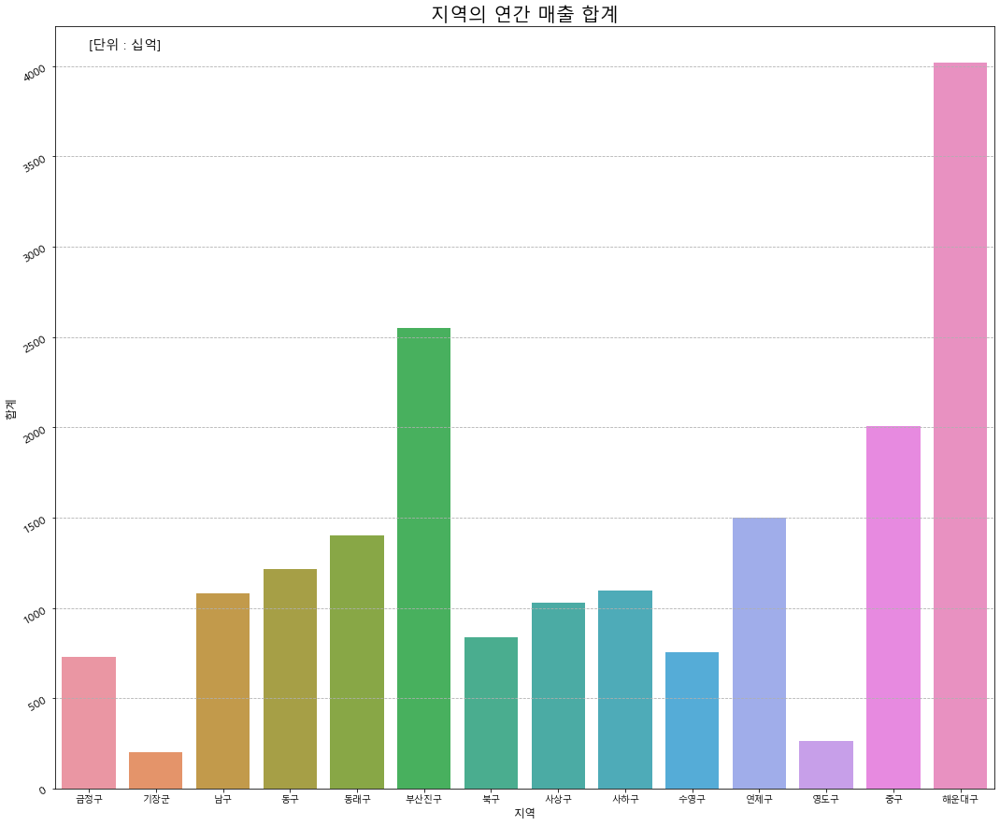

In [88]:
fig, ax = plt.subplots()
fig.set_size_inches(18,15)

sns.barplot(data = total_price, x = '지역', y='금액1')
ax.set_title('지역의 연간 매출 합계', size = 20) # 타이틀 옵션
ax.set_xlabel('지역', size = 12) # x축 제목 크기 조절
ax.set_ylabel('합계', size = 12) # y축 제목 크기 조절
ax.tick_params(axis='y', labelsize = 12, labelrotation = 30) # y축 눈금 크기 조절 + 회전

plt.annotate('[단위 : 십억]', (0.0,4100), size = 14) # 표에 데이터 삽입
plt.grid(True, axis='y', linestyle='--') # 눈금선 그리드 표시

plt.show()

#### json 으로 행정구역을 나누어 folium 사용

In [89]:
# json 불러오기
geo_path = './data/busan_gu.json'

geo_json = json.load(open(geo_path, encoding='utf-8'))

In [90]:
geo_json['features'][0]['properties']['name']

'중구'

In [91]:
lat = 35.181784
long = 129.052852

In [92]:
# folium 사용하여 연간 매출액 표현
# 원본데이터에 강서구, 서구 값이 없어서 검정색으로 나타남

map = folium.Map([lat, long])

folium.Choropleth(
    geo_data=geo_json,
    name='choropleth',
    data=total_price,
    columns=['지역', '금액1'],
    key_on='feature.properties.name',
    fill_color='RdPu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='연간 매출액 [단위 : 십억]'
).add_to(map)

map

#### 결론도출
        

In [93]:
# colors = ['red','blue','green','purple','oragne','beige','darkblue','darkgreen','darkpurple','white','pink','lightblue','lightgreen','lightgrey','black','grey']

# map = folium.Map(location=[35.11608,129.0400], zoom_start=13)  # 지도 초기 로딩위치
map = folium.Map([lat, long])

# 매출데이터 기준 맵구엽 나누기
folium.Choropleth(
    geo_data=geo_json,
    name='choropleth',
    data=total_price,
    columns=['지역', '금액1'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='연간 매출액 [단위 : 십억]'
).add_to(map)

# 커피상권 표시
for i in cafe.index:
    shop_lat = cafe.loc[i, '위도']
    shop_long = cafe.loc[i, '경도']
    title = f"{cafe.loc[i, '도로명주소']}"
    color = 'brown'
    
    folium.CircleMarker([shop_lat, shop_long], radius=1, color=color, tooltip=title).add_to(map)

# 버스데이터 표시
for item in bus_info.index:
    lat = bus_info.loc[item, 'X좌표']
    long = bus_info.loc[item, 'Y좌표']

    folium.CircleMarker([lat, long],  #위도/경도
                                    radius=bus_info.loc[item, '총이용인원']/500,
                                    popup=bus_info.loc[item, '정류장명'],
                                    color='blue',
                                    fill = True).add_to(map)

# 지하철데이터 표시
for item in subway_top.index:
    lat = subway_top.loc[item,'위도']
    long = subway_top.loc[item,'경도']

    folium.CircleMarker([lat,long],
                        radius = subway_top.loc[item,'total']/200000,
                        popup = subway_top.loc[item,'역명'],
                        color = 'yellow',
                        fill = True).add_to(map)

# 공원데이터 표시
for item in park.index:
    lat = park.loc[item,'위도']
    long = park.loc[item,'경도']

    folium.CircleMarker([lat,long],
                        radius = park.loc[item,'공원면적']/150000,
                        popup = park.loc[item,'공원명'],
                        color = 'green',
                        fill = True).add_to(map)

# 대규모점포 표시
for item in store.index:
    lat = store.loc[item,'위도']
    long = store.loc[item,'경도']

    folium.CircleMarker([lat,long],
                        radius = store.loc[item,'총 매장면적(제곱미터)']/10000,
                        popup = store.loc[item,'상호'],
                        color = 'orange',
                        fill = True).add_to(map)

map

#### 앞서 상권데이터와 카페데이터로 도출해낸 결과인 부산진구, 해운대구, 중구, 동래구, 금정구, 기장군 확인
    1. 부산진구 11개
    2. 중구 8개
    3. 동래구 5개
    4. 해운대구 2개
    5. 금정구 3개
    6. 기장군 1개
    => 부산진구, 중구, 동래구로 유력 후보지 선정